In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/README.dataset.txt
/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/README.roboflow.txt
/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/data.yaml
/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/split.py
/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/val/labels/8_00108_jpg.rf.3335d7cd1850cfa9d60d5bf7b48b5f33.txt
/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/val/labels/10_00103_jpg.rf.1549154b51978d775abdb07b0bbf8ed7.txt
/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/val/labels/6_00054_jpg.rf.e55a6a8deba73ad5807c903e5299991d.txt
/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/val/labels/8_00088_jpg.rf.a4abd94687414d676ac4047fb693d2d7.txt
/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/val/labels/3_00149_jpg.rf.cf5567a5c4ca41e0ac97599663a260e9.txt
/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/val/labels/11_00031_jpg.rf.fb6cad24e

In [2]:
# Pip install method (recommended)
%pip install ultralytics
!pip install ultralytics

Note: you may need to restart the kernel to use updated packages.


In [3]:
# Importing the required libraries
from ultralytics import YOLO
import squarify
import matplotlib.pyplot as plt
import cv2
import os
import random
import pandas as pd
import matplotlib.image as mpimg
import seaborn as sns
import torch

sns.set_style('darkgrid')

%matplotlib inline

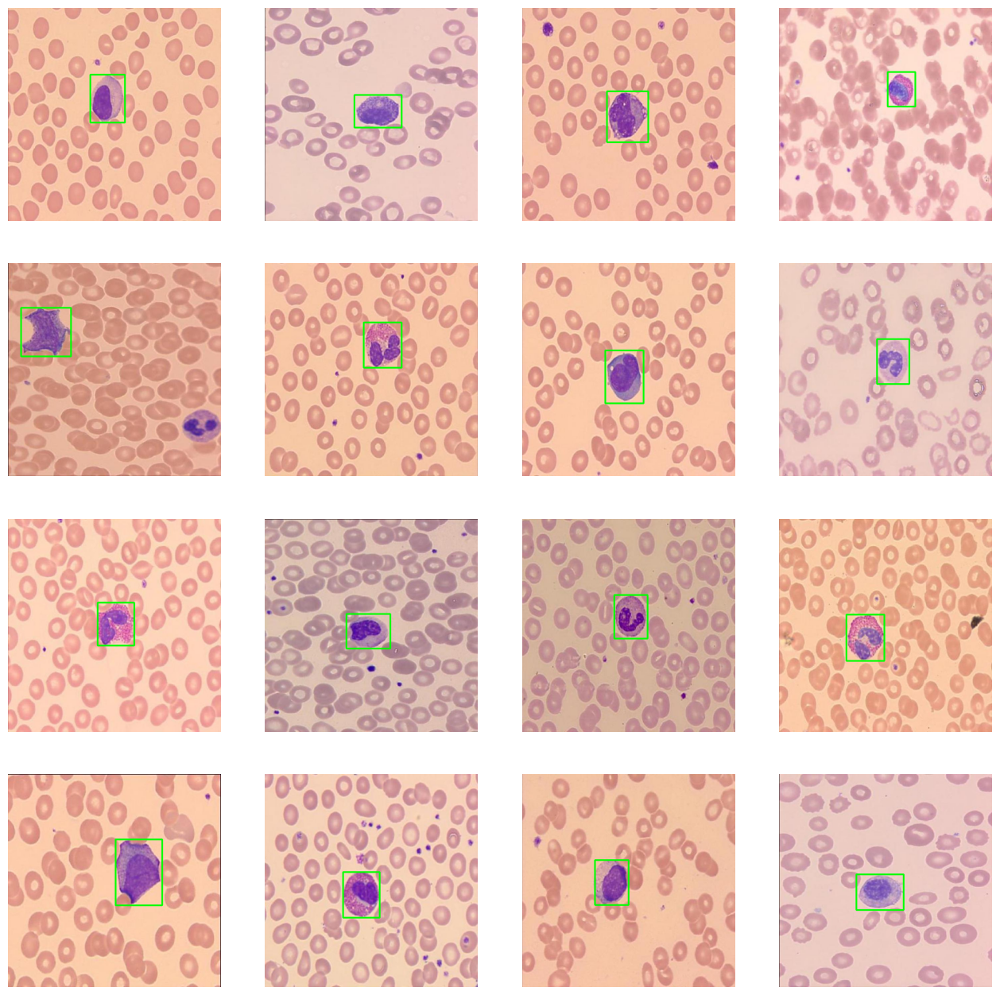

In [4]:
# Define the paths to the images and labels directories
train_images = "/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/train/images"
train_labels = "/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/train/labels"

test_images = "/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/images"
test_labels = "/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/labels"

val_images = "/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/val/images"
val_labels = "/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/val/labels"

# Get a list of all the image files in the training images directory
image_files = os.listdir(train_images)

# Choose 16 random image files from the list
random_images = random.sample(image_files, 16)

# Set up the plot
fig, axs = plt.subplots(4, 4, figsize=(16, 16))

# Loop over the random images and plot the object detections
for i, image_file in enumerate(random_images):
    row = i // 4
    col = i % 4
    
    # Load the image
    image_path = os.path.join(train_images, image_file)
    image = cv2.imread(image_path)

    # Load the labels for this image
    label_file = os.path.splitext(image_file)[0] + ".txt"
    label_path = os.path.join(train_labels, label_file)
    with open(label_path, "r") as f:
        labels = f.read().strip().split("\n")

    # Loop over the labels and plot the object detections
    # Loop over the labels and plot the object detections
    for label in labels:
        if len(label.split()) != 5:
            continue
        class_id, x_center, y_center, width, height = map(float, label.split())
        x_min = int((x_center - width/2) * image.shape[1])
        y_min = int((y_center - height/2) * image.shape[0])
        x_max = int((x_center + width/2) * image.shape[1])
        y_max = int((y_center + height/2) * image.shape[0])
        cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (0, 255, 0), 3)


    # Show the image with the object detections
    axs[row, col].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axs[row, col].axis('off')

plt.show()

In [5]:
# Load an image using OpenCV
image = cv2.imread("/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/train/images/10_00001_jpg.rf.4fcbf927a55ca52647a1f9e5d1beb0b7.jpg")

# Get the size of the image
height, width, channels = image.shape
print(f"The image has dimensions {width}x{height} and {channels} channels.")

The image has dimensions 640x640 and 3 channels.


In [6]:

from ultralytics import YOLO

# Load a pre-trained YOLOv10n model
model = YOLO("yolov10n.pt")

In [7]:

# free up GPU memory
torch.cuda.empty_cache()

# Train the model
model.train(
    data='/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/data.yaml',  
    epochs=80,
    imgsz=640,                                  
    device='0'                       
)


Ultralytics 8.3.10 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov10n.pt, data=/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/data.yaml, epochs=80, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labe

2024-10-11 21:00:23,854	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-10-11 21:00:24,025	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


Overriding model.yaml nc=80 with nc=12

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1      9856  ultralytics.nn.modules.block.SCDown          [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1     36096  ultralytic

wandb: Using wandb-core as the SDK backend. Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: gazifahimfaiyaz007 (gazifahimfaiyaz007-east-delta-university). Use `wandb login --relogin` to force relogin


Freezing layer 'model.23.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLO11n...
AMP: checks passed ✅


train: Scanning /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/train/labels... 5803 images, 0 backgrounds, 0 corrupt: 100%|██████████| 5803/5803 [00:07<00:00, 818.74it/s]


train: WARNING ⚠️ Cache directory /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/train is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/site-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 1.4.18 (you have 1.4.17). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/val/labels... 717 images, 0 backgrounds, 0 corrupt: 100%|██████████| 717/717 [00:01<00:00, 678.06it/s]

val: WARNING ⚠️ Cache directory /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/val is not writeable, cache not saved.


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000625, momentum=0.9) with parameter groups 95 weight(decay=0.0), 108 weight(decay=0.0005), 107 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train2
Starting training for 80 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/80      3.03G       1.57       10.2      2.013         16        640: 100%|██████████| 363/363 [01:24<00:00,  4.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:06<00:00,  3.71it/s]


                   all        717        809      0.317      0.501      0.368      0.311

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/80      3.02G      1.546      6.774      1.972         20        640: 100%|██████████| 363/363 [01:20<00:00,  4.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.71it/s]

                   all        717        809      0.421      0.545      0.463      0.392



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/80      3.03G      1.596      4.772      1.998         26        640: 100%|██████████| 363/363 [01:18<00:00,  4.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.62it/s]

                   all        717        809      0.454      0.596      0.514      0.432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/80      3.02G      1.548      3.642      1.982         11        640: 100%|██████████| 363/363 [01:18<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.62it/s]

                   all        717        809      0.501      0.566      0.541      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/80      3.02G       1.52       3.11      1.973         20        640: 100%|██████████| 363/363 [01:18<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.64it/s]

                   all        717        809      0.537      0.649      0.598      0.505



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/80      3.05G      1.474      2.783      1.955         19        640: 100%|██████████| 363/363 [01:18<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:05<00:00,  4.60it/s]

                   all        717        809      0.536      0.645      0.619      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/80      3.02G      1.471      2.586      1.955         15        640: 100%|██████████| 363/363 [01:18<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.66it/s]

                   all        717        809      0.619      0.625      0.654      0.566



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/80      3.02G      1.433      2.431      1.947         18        640: 100%|██████████| 363/363 [01:18<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:05<00:00,  4.53it/s]

                   all        717        809      0.675      0.638      0.689      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/80      3.02G      1.415      2.332      1.936         23        640: 100%|██████████| 363/363 [01:18<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.74it/s]

                   all        717        809      0.677      0.668      0.727      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/80      3.03G      1.395      2.229      1.923         26        640: 100%|██████████| 363/363 [01:18<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.73it/s]

                   all        717        809      0.673       0.75      0.747      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/80      3.03G      1.385      2.153       1.93         14        640: 100%|██████████| 363/363 [01:18<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.68it/s]

                   all        717        809      0.696      0.712      0.742      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/80      3.02G      1.365      2.061      1.922         14        640: 100%|██████████| 363/363 [01:18<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.67it/s]

                   all        717        809       0.66      0.712      0.737      0.642



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/80      3.03G      1.358      2.005      1.909         24        640: 100%|██████████| 363/363 [01:18<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.78it/s]

                   all        717        809      0.725      0.711      0.784      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/80      3.02G      1.354      1.981      1.913         20        640: 100%|██████████| 363/363 [01:18<00:00,  4.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.82it/s]

                   all        717        809      0.733      0.741       0.79      0.692



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/80      3.02G      1.349      1.934      1.915         21        640: 100%|██████████| 363/363 [01:18<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.84it/s]

                   all        717        809      0.712      0.741      0.788      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/80      3.02G      1.339      1.848      1.919         16        640: 100%|██████████| 363/363 [01:18<00:00,  4.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.70it/s]

                   all        717        809      0.752      0.772      0.818      0.717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/80      3.02G      1.341      1.815      1.917         14        640: 100%|██████████| 363/363 [01:18<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.83it/s]

                   all        717        809      0.742       0.72      0.792      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/80      3.02G      1.316      1.788      1.896         22        640: 100%|██████████| 363/363 [01:18<00:00,  4.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.81it/s]

                   all        717        809      0.783      0.815      0.856      0.755



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/80      3.02G        1.3      1.765      1.899         26        640: 100%|██████████| 363/363 [01:18<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.77it/s]

                   all        717        809      0.733      0.801      0.832      0.727



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/80      3.02G      1.303      1.721      1.896         22        640: 100%|██████████| 363/363 [01:18<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.80it/s]

                   all        717        809      0.749      0.832      0.853      0.748



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/80      3.02G      1.289      1.687      1.895         15        640: 100%|██████████| 363/363 [01:18<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.69it/s]

                   all        717        809      0.734        0.8      0.815      0.718



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/80      3.02G      1.257      1.661      1.879         23        640: 100%|██████████| 363/363 [01:18<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.79it/s]

                   all        717        809       0.79      0.786      0.862      0.761



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/80      3.02G      1.294      1.598      1.889         14        640: 100%|██████████| 363/363 [01:18<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.82it/s]

                   all        717        809      0.763      0.823      0.859      0.758



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/80      3.02G      1.287       1.62      1.891         26        640: 100%|██████████| 363/363 [01:18<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.85it/s]

                   all        717        809      0.814      0.824      0.884      0.783



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/80      3.02G      1.276      1.585      1.882         22        640: 100%|██████████| 363/363 [01:18<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.84it/s]

                   all        717        809      0.763      0.828      0.848       0.75



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/80      3.02G      1.262      1.534      1.876         12        640: 100%|██████████| 363/363 [01:18<00:00,  4.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.82it/s]

                   all        717        809        0.8      0.826      0.878       0.78



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/80      3.02G      1.269      1.521      1.884         21        640: 100%|██████████| 363/363 [01:18<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.84it/s]

                   all        717        809       0.83      0.846      0.899      0.795



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/80      3.02G      1.253      1.491      1.878         20        640: 100%|██████████| 363/363 [01:18<00:00,  4.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.81it/s]

                   all        717        809      0.802      0.821      0.869      0.768



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/80      3.02G      1.263      1.513      1.885         15        640: 100%|██████████| 363/363 [01:18<00:00,  4.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.84it/s]

                   all        717        809       0.83      0.792      0.881      0.785



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/80      3.02G      1.242      1.429      1.874         23        640: 100%|██████████| 363/363 [01:18<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.87it/s]

                   all        717        809      0.791      0.862      0.894      0.797



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/80      3.02G      1.241      1.391      1.877         24        640: 100%|██████████| 363/363 [01:18<00:00,  4.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.63it/s]

                   all        717        809      0.813      0.858      0.905      0.808



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/80      3.02G      1.219      1.374      1.865         17        640: 100%|██████████| 363/363 [01:18<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.83it/s]

                   all        717        809      0.834      0.857      0.904      0.803



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/80      3.02G      1.231      1.392      1.872         21        640: 100%|██████████| 363/363 [01:18<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.95it/s]

                   all        717        809      0.836      0.862      0.909      0.812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/80      3.02G      1.215      1.357      1.856         15        640: 100%|██████████| 363/363 [01:18<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.79it/s]

                   all        717        809      0.859      0.841      0.917       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/80      3.02G      1.223      1.357      1.867         28        640: 100%|██████████| 363/363 [01:18<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.98it/s]

                   all        717        809      0.827      0.881      0.912      0.817



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/80      3.02G      1.218      1.291      1.867         20        640: 100%|██████████| 363/363 [01:18<00:00,  4.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.85it/s]

                   all        717        809      0.859      0.867      0.928       0.83



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/80      3.02G      1.214      1.325      1.862         18        640: 100%|██████████| 363/363 [01:18<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.89it/s]

                   all        717        809      0.839      0.887      0.916      0.821



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/80      3.02G      1.204      1.253      1.862         19        640: 100%|██████████| 363/363 [01:17<00:00,  4.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.93it/s]

                   all        717        809      0.862      0.849      0.908      0.813



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/80      3.03G      1.195      1.276      1.855         15        640: 100%|██████████| 363/363 [01:18<00:00,  4.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.72it/s]

                   all        717        809      0.854      0.876      0.918      0.823



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/80      3.02G      1.194      1.241      1.854         22        640: 100%|██████████| 363/363 [01:18<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.92it/s]

                   all        717        809      0.858      0.882      0.928      0.827



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/80      3.02G      1.195      1.228      1.852         28        640: 100%|██████████| 363/363 [01:18<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.83it/s]

                   all        717        809      0.881      0.878      0.929      0.833



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/80      3.02G      1.191      1.201      1.858         24        640: 100%|██████████| 363/363 [01:18<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.81it/s]

                   all        717        809      0.864      0.877      0.929      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/80      3.02G      1.177      1.165      1.847         20        640: 100%|██████████| 363/363 [01:18<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.92it/s]

                   all        717        809      0.881      0.911      0.944      0.845



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/80      3.03G       1.17      1.145      1.841         17        640: 100%|██████████| 363/363 [01:18<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.87it/s]

                   all        717        809      0.879      0.903      0.949      0.853



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/80      3.02G      1.187       1.14      1.852         14        640: 100%|██████████| 363/363 [01:18<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.94it/s]

                   all        717        809      0.882      0.877      0.936      0.841



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/80      3.02G      1.165      1.113       1.84         25        640: 100%|██████████| 363/363 [01:18<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.88it/s]

                   all        717        809      0.922      0.888      0.951      0.857



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/80      3.02G      1.148      1.107      1.829         14        640: 100%|██████████| 363/363 [01:18<00:00,  4.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.81it/s]

                   all        717        809      0.899      0.911      0.949      0.856



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/80      3.01G      1.156       1.12      1.842         21        640: 100%|██████████| 363/363 [01:18<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.85it/s]

                   all        717        809       0.88      0.907      0.948      0.853



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/80      3.02G      1.164      1.078       1.85         15        640: 100%|██████████| 363/363 [01:18<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.82it/s]

                   all        717        809      0.899      0.915      0.956      0.859



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/80      3.02G      1.146       1.08      1.835         20        640: 100%|██████████| 363/363 [01:18<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.67it/s]

                   all        717        809      0.914       0.91      0.959      0.865



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      51/80      3.02G      1.147      1.072      1.838         22        640: 100%|██████████| 363/363 [01:18<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.90it/s]

                   all        717        809      0.913      0.938      0.964      0.871



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      52/80      3.02G      1.147      1.016      1.839         27        640: 100%|██████████| 363/363 [01:18<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.84it/s]

                   all        717        809      0.902      0.922      0.958      0.865



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      53/80      3.02G      1.125     0.9938      1.832         24        640: 100%|██████████| 363/363 [01:18<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.87it/s]

                   all        717        809      0.887      0.939      0.956      0.866



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      54/80      3.02G      1.142      1.005      1.834         19        640: 100%|██████████| 363/363 [01:18<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.84it/s]

                   all        717        809      0.917      0.945       0.97      0.881



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      55/80      3.02G      1.131      1.001      1.836         22        640: 100%|██████████| 363/363 [01:18<00:00,  4.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.87it/s]

                   all        717        809      0.941      0.904      0.966      0.878



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      56/80      3.02G      1.122     0.9754       1.83         17        640: 100%|██████████| 363/363 [01:18<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.94it/s]

                   all        717        809      0.916      0.936      0.968      0.876



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      57/80      3.02G      1.116     0.9617      1.825         19        640: 100%|██████████| 363/363 [01:18<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.88it/s]

                   all        717        809       0.92       0.93      0.964      0.876



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      58/80      3.02G      1.098     0.9305       1.82         23        640: 100%|██████████| 363/363 [01:18<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.79it/s]

                   all        717        809       0.92      0.947      0.967      0.877



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      59/80      3.02G      1.112      0.936      1.819         22        640: 100%|██████████| 363/363 [01:18<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.84it/s]

                   all        717        809      0.919       0.94       0.97      0.881



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      60/80      3.02G      1.093     0.9002      1.819         21        640: 100%|██████████| 363/363 [01:18<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.88it/s]

                   all        717        809      0.933      0.925      0.972      0.884



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      61/80      3.02G      1.093     0.9208      1.816         28        640: 100%|██████████| 363/363 [01:18<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.85it/s]

                   all        717        809      0.946      0.932      0.974      0.885



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      62/80      3.02G      1.087     0.9021      1.813         15        640: 100%|██████████| 363/363 [01:18<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.92it/s]

                   all        717        809      0.934      0.937      0.971      0.883



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      63/80      3.02G      1.083     0.8779      1.811         14        640: 100%|██████████| 363/363 [01:18<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.99it/s]

                   all        717        809      0.939      0.931      0.973      0.882



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      64/80      3.02G      1.078      0.843      1.809         22        640: 100%|██████████| 363/363 [01:18<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.84it/s]

                   all        717        809      0.953      0.932      0.976       0.89



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      65/80      3.02G       1.07     0.8391      1.806         23        640: 100%|██████████| 363/363 [01:18<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.93it/s]

                   all        717        809      0.956      0.935      0.974      0.888



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      66/80      3.01G      1.072     0.8483      1.811         24        640: 100%|██████████| 363/363 [01:17<00:00,  4.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.79it/s]

                   all        717        809      0.953      0.948      0.977      0.887



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      67/80      3.02G       1.06     0.8293      1.806         21        640: 100%|██████████| 363/363 [01:18<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.97it/s]

                   all        717        809      0.932      0.949      0.971      0.886



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      68/80      3.02G      1.056     0.8197      1.811         22        640: 100%|██████████| 363/363 [01:18<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.99it/s]

                   all        717        809      0.949      0.943      0.976      0.893



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      69/80      3.02G      1.055     0.8134      1.798         23        640: 100%|██████████| 363/363 [01:17<00:00,  4.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.94it/s]

                   all        717        809      0.951      0.937      0.975      0.891



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      70/80      3.03G      1.056     0.8213      1.805         22        640: 100%|██████████| 363/363 [01:18<00:00,  4.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.98it/s]

                   all        717        809      0.942       0.94      0.976       0.89


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      71/80      3.01G      0.902     0.5726      1.727         13        640: 100%|██████████| 363/363 [01:18<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.85it/s]

                   all        717        809      0.966      0.941      0.977      0.893



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      72/80      3.01G     0.8812     0.5084      1.711         11        640: 100%|██████████| 363/363 [01:17<00:00,  4.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.97it/s]

                   all        717        809       0.93      0.957      0.976      0.894



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      73/80      3.01G     0.8804     0.4752      1.715         11        640: 100%|██████████| 363/363 [01:17<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.88it/s]

                   all        717        809      0.956      0.952      0.979        0.9



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      74/80      3.01G     0.8713     0.4641      1.711         13        640: 100%|██████████| 363/363 [01:17<00:00,  4.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.87it/s]

                   all        717        809      0.953      0.947       0.98      0.902



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      75/80      3.01G     0.8607     0.4497      1.707         11        640: 100%|██████████| 363/363 [01:17<00:00,  4.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.94it/s]

                   all        717        809       0.95      0.951       0.98      0.903



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      76/80      3.03G     0.8588     0.4453      1.704         11        640: 100%|██████████| 363/363 [01:17<00:00,  4.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.98it/s]

                   all        717        809      0.953      0.963      0.982      0.903



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      77/80      3.01G     0.8499     0.4437      1.701         13        640: 100%|██████████| 363/363 [01:17<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.96it/s]

                   all        717        809      0.972      0.953      0.982      0.904



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      78/80      3.01G     0.8509     0.4322      1.704         11        640: 100%|██████████| 363/363 [01:17<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.94it/s]

                   all        717        809       0.96      0.954      0.982      0.903



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      79/80      3.01G     0.8445     0.4343      1.695         11        640: 100%|██████████| 363/363 [01:17<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  4.79it/s]

                   all        717        809       0.96      0.953      0.981      0.903



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      80/80      3.02G     0.8353     0.4194      1.696         12        640: 100%|██████████| 363/363 [01:17<00:00,  4.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:04<00:00,  5.03it/s]

                   all        717        809      0.961      0.958      0.982      0.903



80 epochs completed in 1.879 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 5.8MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 5.8MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics 8.3.10 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
YOLOv10n summary (fused): 285 layers, 2,699,096 parameters, 0 gradients, 8.2 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 23/23 [00:05<00:00,  4.43it/s]


                   all        717        809      0.972      0.952      0.982      0.904
   Atypical lymphocyte         62         72      0.971      0.914      0.986      0.875
       Band Neutrophil         63         73      0.943      0.959      0.957      0.884
              Basophil         72         73          1      0.995      0.995      0.921
                 Blast         28         63          1      0.927      0.978      0.918
            Eosinophil         58         59          1       0.98      0.988      0.893
            Lymphocyte         68         69      0.985      0.938      0.985      0.911
         Metamyelocyte         67         68      0.951      0.926      0.972      0.912
              Monocyte         55         57      0.966       0.93       0.99      0.939
             Myelocyte         56         62       0.89      0.952      0.971      0.865
                   NRC         53         58      0.975      0.983      0.993      0.922
          Promyelocyt

lr/pg0,▃████▇▇▇▇▇▇▆▆▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▂▂▂▂▁▁
lr/pg1,▃▆███▇▇▇▇▇▆▆▆▆▅▅▅▅▅▅▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▁▁▁▁
lr/pg2,████▇▇▇▇▇▆▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▄▃▃▃▂▂▂▂▂▁▁▁▁
metrics/mAP50(B),▁▂▃▄▅▅▅▆▇▆▆▇▇▇▇▇▇▇▇█████████████████████
metrics/mAP50-95(B),▁▃▃▄▄▅▅▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇██████████████
metrics/precision(B),▁▂▃▃▃▅▅▅▅▅▆▆▆▆▆▇▇▇▆▇▇▇▇▇▇▇▇▇▇▇██████████
metrics/recall(B),▂▁▃▂▂▃▄▄▄▅▅▅▆▆▆▅▆▆▆▆▇▇▇▇▇▇▇█████████████
model/GFLOPs,▁
model/parameters,▁
model/speed_PyTorch(ms),▁
train/box_loss,████▇▆▆▆▅▅▅▅▅▅▅▅▅▅▅▄▄▄▄▄▄▄▄▄▄▄▃▃▃▃▃▃▃▁▁▁


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7d00287d4fd0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,  

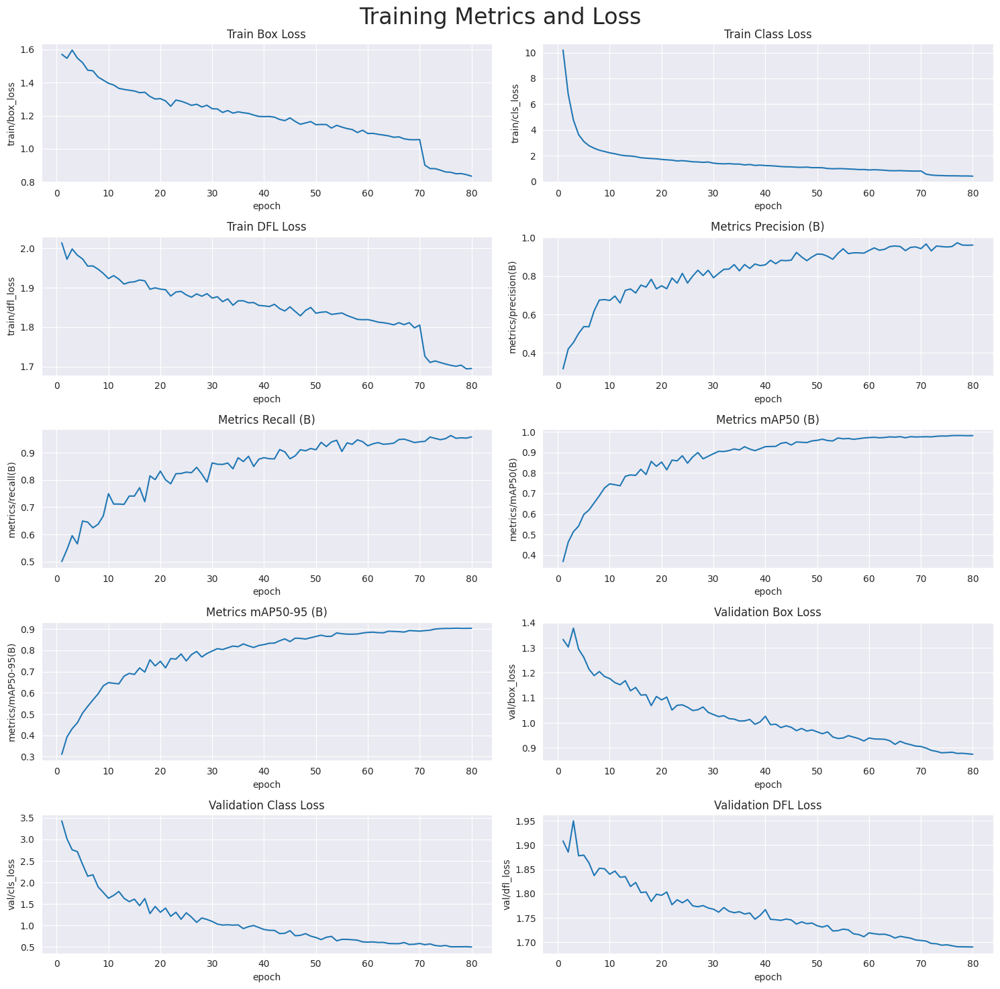

In [9]:
%matplotlib inline
# read in the results.csv file as a pandas dataframe
df = pd.read_csv('/kaggle/working/runs/detect/train2/results.csv')
df.columns = df.columns.str.strip()

# create subplots using seaborn
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

# plot the columns using seaborn
sns.lineplot(x='epoch', y='train/box_loss', data=df, ax=axs[0,0])
sns.lineplot(x='epoch', y='train/cls_loss', data=df, ax=axs[0,1])
sns.lineplot(x='epoch', y='train/dfl_loss', data=df, ax=axs[1,0])
sns.lineplot(x='epoch', y='metrics/precision(B)', data=df, ax=axs[1,1])
sns.lineplot(x='epoch', y='metrics/recall(B)', data=df, ax=axs[2,0])
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=df, ax=axs[2,1])
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=df, ax=axs[3,0])
sns.lineplot(x='epoch', y='val/box_loss', data=df, ax=axs[3,1])
sns.lineplot(x='epoch', y='val/cls_loss', data=df, ax=axs[4,0])
sns.lineplot(x='epoch', y='val/dfl_loss', data=df, ax=axs[4,1])

# set titles and axis labels for each subplot
axs[0,0].set(title='Train Box Loss')
axs[0,1].set(title='Train Class Loss')
axs[1,0].set(title='Train DFL Loss')
axs[1,1].set(title='Metrics Precision (B)')
axs[2,0].set(title='Metrics Recall (B)')
axs[2,1].set(title='Metrics mAP50 (B)')
axs[3,0].set(title='Metrics mAP50-95 (B)')
axs[3,1].set(title='Validation Box Loss')
axs[4,0].set(title='Validation Class Loss')
axs[4,1].set(title='Validation DFL Loss')

# add suptitle and subheader
plt.suptitle('Training Metrics and Loss', fontsize=24)

# adjust top margin to make space for suptitle
plt.subplots_adjust(top=0.8)

# adjust spacing between subplots
plt.tight_layout()

plt.show()

In [11]:
%matplotlib inline
# Loading the best performing model
model = YOLO('/kaggle/working/runs/detect/train2/weights/best.pt')

# Evaluating the model on the test dataset
metrics = model.val(conf = 0.25, split = 'test')

Ultralytics 8.3.10 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla T4, 15095MiB)
YOLOv10n summary (fused): 285 layers, 2,699,096 parameters, 0 gradients, 8.2 GFLOPs


val: Scanning /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/labels... 667 images, 0 backgrounds, 0 corrupt: 100%|██████████| 667/667 [00:02<00:00, 225.31it/s]

val: WARNING ⚠️ Cache directory /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test is not writeable, cache not saved.



/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:06<00:00,  6.52it/s]


                   all        667        817      0.793      0.812      0.819      0.739
   Atypical lymphocyte         98        105      0.917      0.733      0.852      0.728
       Band Neutrophil         80         99      0.854      0.768      0.834      0.779
              Basophil         90         99      0.978      0.879      0.938      0.849
                 Blast         54        121      0.972      0.868      0.931      0.857
         Metamyelocyte         86         87      0.711      0.793      0.774      0.714
             Myelocyte         82        100       0.66       0.68      0.709       0.61
                   NRC         87         91      0.847      0.912      0.916      0.797
          Promyelocyte         73         92      0.754      0.935      0.916      0.842
  Segmented neutrophil         20         23      0.447      0.739      0.503      0.474
Speed: 0.2ms preprocess, 5.0ms inference, 0.0ms loss, 0.3ms postprocess per image
Results saved to runs/detect

In [ ]:
%matplotlib inline
# Create the barplot
ax = sns.barplot(x=['mAP50-95', 'mAP50', 'mAP75'], y=[metrics.box.map, metrics.box.map50, metrics.box.map75])

# Set the title and axis labels
ax.set_title('YOLO Evaluation Metrics')
ax.set_xlabel('Metric')
ax.set_ylabel('Value')

# Set the figure size
fig = plt.gcf()
fig.set_size_inches(8, 6)

# Add the values on top of the bars
for p in ax.patches:
    ax.annotate('{:.3f}'.format(p.get_height()), (p.get_x() + p.get_width() / 2, p.get_height()), ha='center', va='bottom')
    
# Show the plot
plt.show()

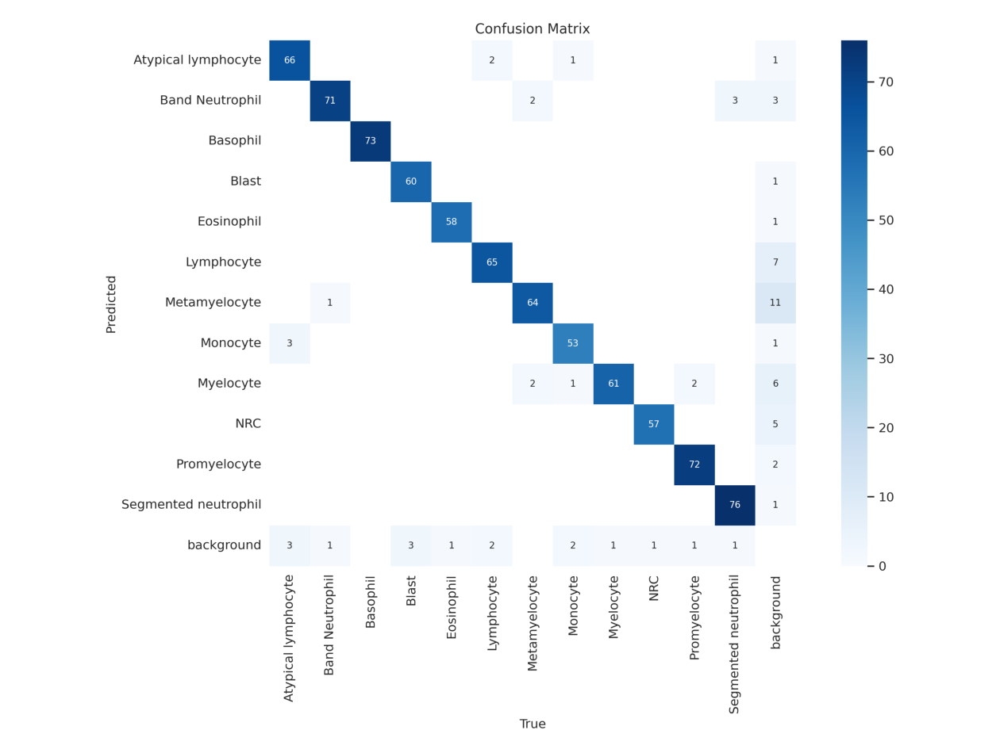

In [12]:
%matplotlib inline
# Reading the confusion matrix image file
img = mpimg.imread('/kaggle/working/runs/detect/train2/confusion_matrix.png')

# Plotting the confusion matrix image
fig, ax = plt.subplots(figsize = (16, 16))

ax.imshow(img)
ax.axis('off');

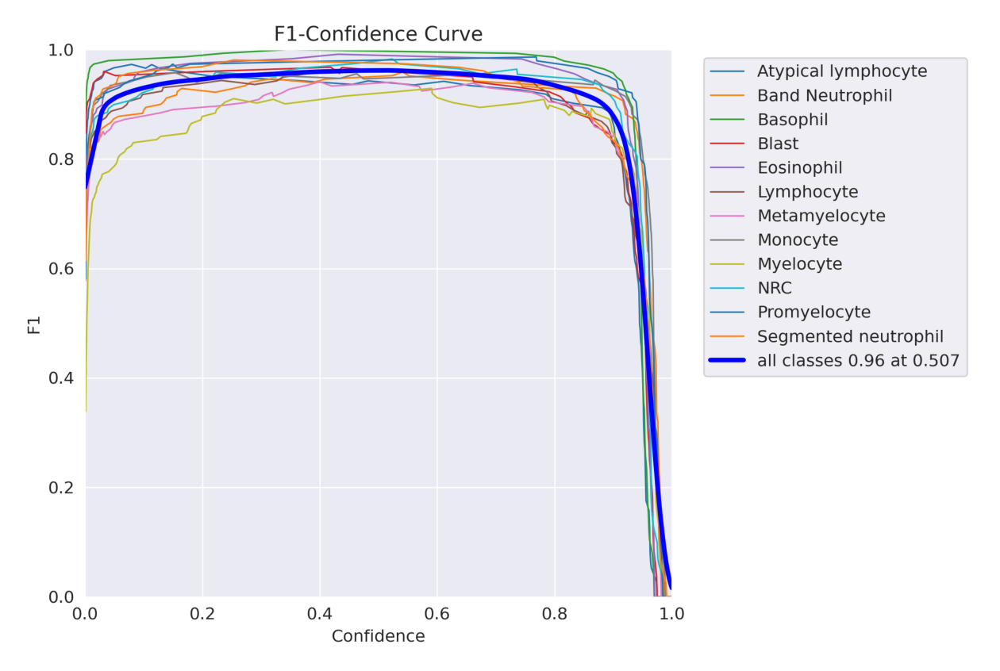

In [13]:
%matplotlib inline
# Reading the confusion matrix image file
img = mpimg.imread('/kaggle/working/runs/detect/train2/F1_curve.png')

# Plotting the confusion matrix image
fig, ax = plt.subplots(figsize = (16, 16))

ax.imshow(img)
ax.axis('off');

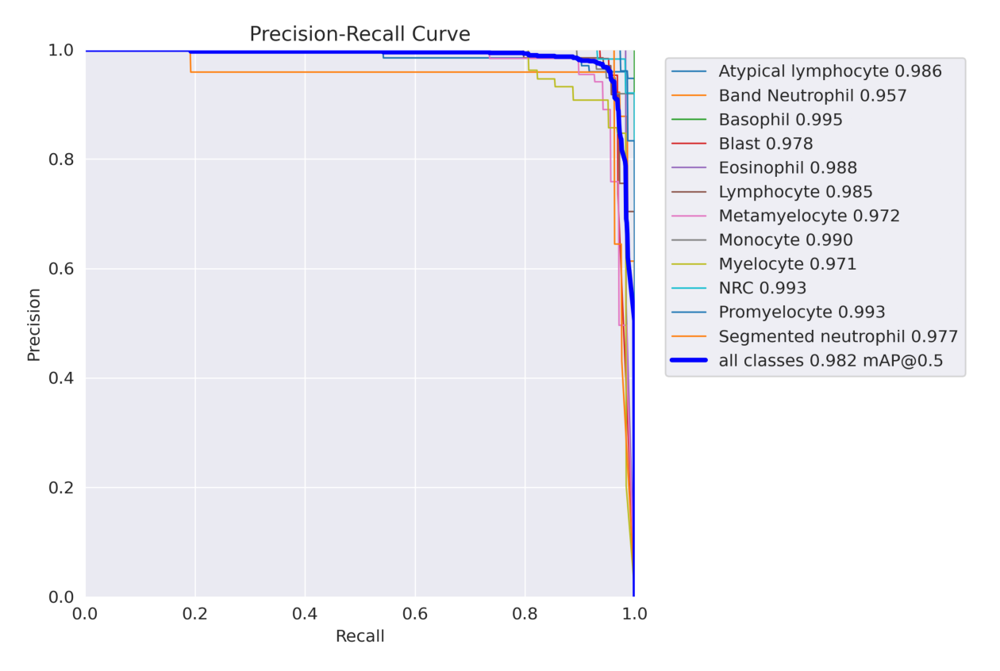

In [14]:
%matplotlib inline
# Reading the confusion matrix image file
img = mpimg.imread('/kaggle/working/runs/detect/train2/PR_curve.png')

# Plotting the confusion matrix image
fig, ax = plt.subplots(figsize = (16, 16))

ax.imshow(img)
ax.axis('off');

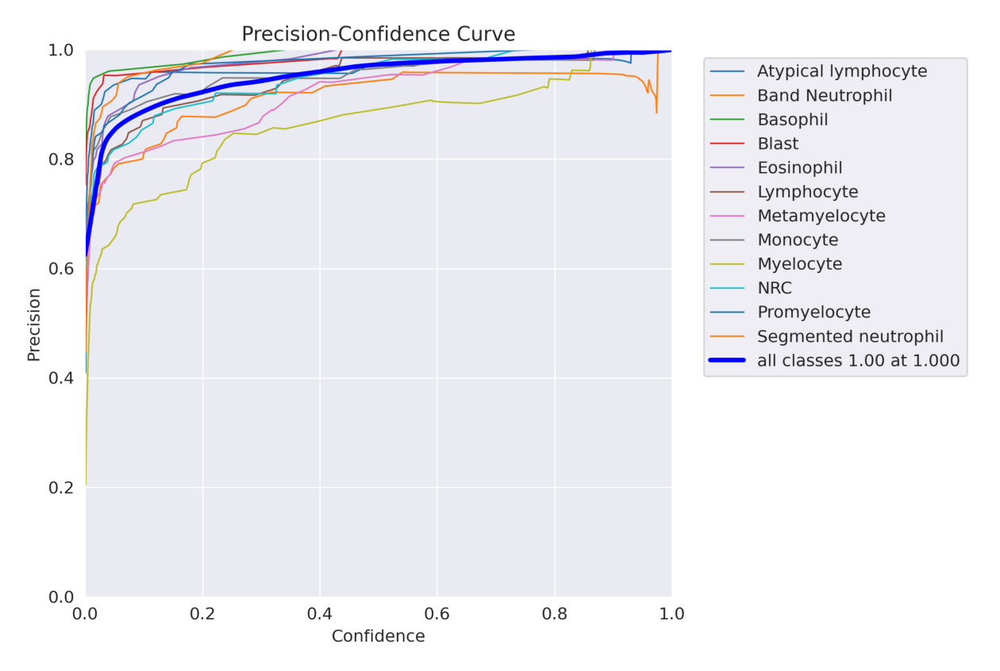

In [16]:
%matplotlib inline
# Reading the confusion matrix image file
img = mpimg.imread('/kaggle/working/runs/detect/train2/P_curve.png')

# Plotting the confusion matrix image
fig, ax = plt.subplots(figsize = (16, 16))

ax.imshow(img)
ax.axis('off');

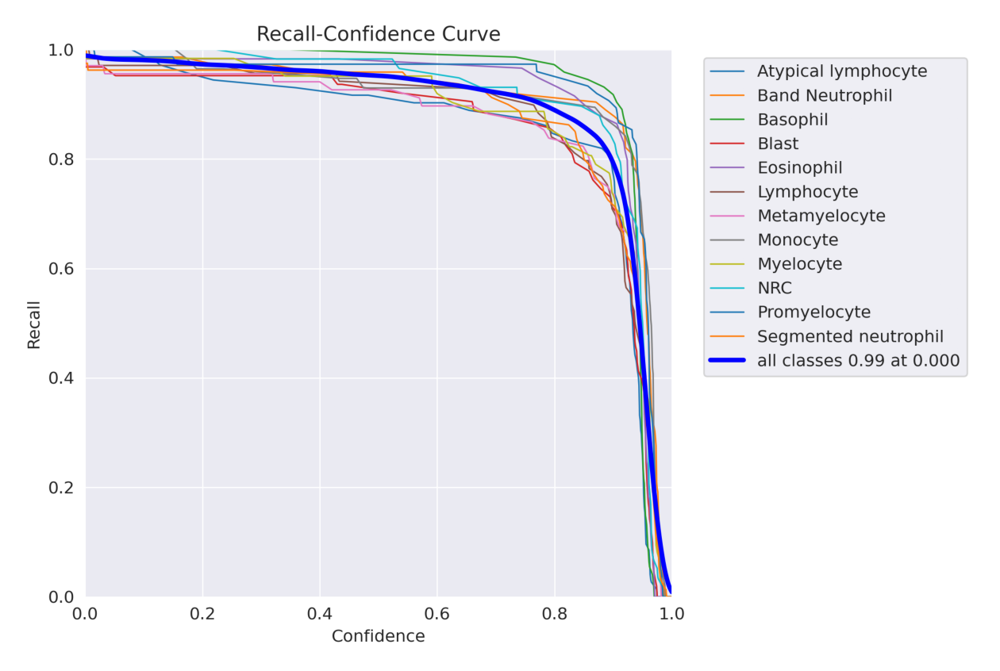

In [15]:
%matplotlib inline
# Reading the confusion matrix image file
img = mpimg.imread('/kaggle/working/runs/detect/train2/R_curve.png')

# Plotting the confusion matrix image
fig, ax = plt.subplots(figsize = (16, 16))

ax.imshow(img)
ax.axis('off');

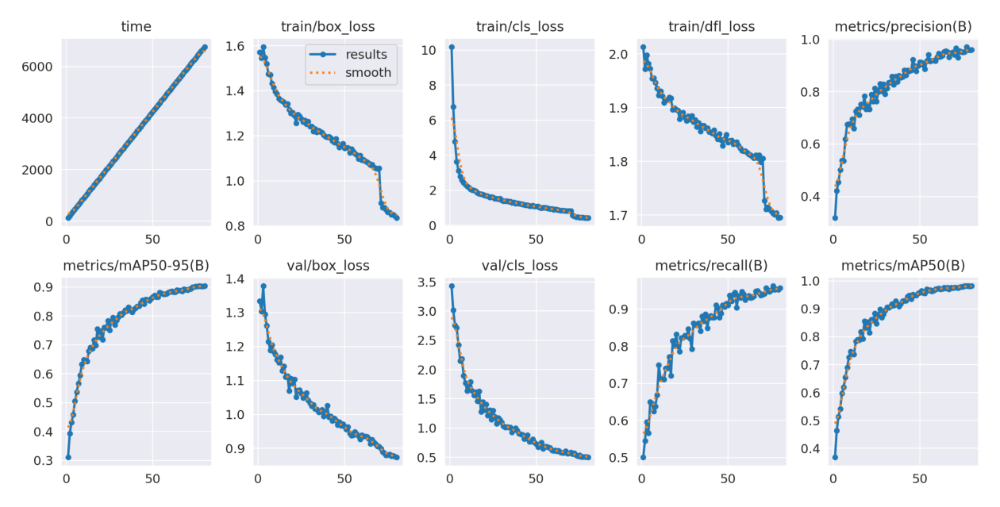

In [17]:
%matplotlib inline
# Reading the confusion matrix image file
img = mpimg.imread('/kaggle/working/runs/detect/train2/results.png')

# Plotting the confusion matrix image
fig, ax = plt.subplots(figsize = (16, 16))

ax.imshow(img)
ax.axis('off');

In [18]:
# Function to perform ship detections
def ship_detect(img_path):
    
    # Read the image
    img = cv2.imread(img_path)

    # Pass the image through the detection model and get the result
    detect_result = model(img)

    # Plot the detections
    detect_img = detect_result[0].plot()
    
    # Convert the image to RGB format
    detect_img = cv2.cvtColor(detect_img, cv2.COLOR_BGR2RGB)
    
    return detect_img


0: 640x640 1 Atypical lymphocyte, 13.0ms
Speed: 3.1ms preprocess, 13.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Promyelocyte, 10.4ms
Speed: 1.7ms preprocess, 10.4ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 NRCs, 11.5ms
Speed: 1.6ms preprocess, 11.5ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Metamyelocyte, 12.5ms
Speed: 1.8ms preprocess, 12.5ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Basophil, 10.2ms
Speed: 1.7ms preprocess, 10.2ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Myelocyte, 10.3ms
Speed: 1.8ms preprocess, 10.3ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Metamyelocyte, 10.5ms
Speed: 2.2ms preprocess, 10.5ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Basophil, 10.9ms
Speed: 3.0ms preprocess, 10.9ms inference, 0.5ms po

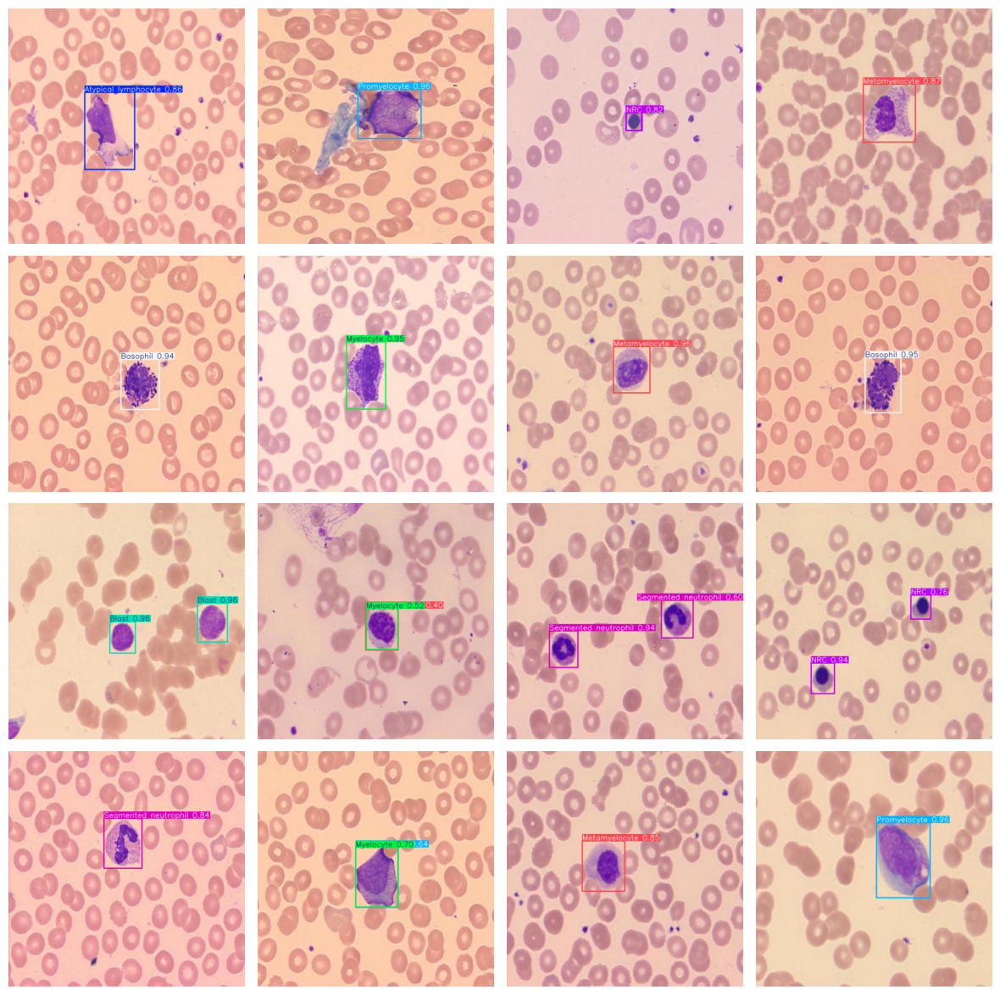

In [19]:
import random

# Define the directory where the custom images are stored
custom_image_dir = '/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/images'

# Get the list of image files in the directory
image_files = os.listdir(custom_image_dir)

# Select 16 random images from the list
selected_images = random.sample(image_files, 16)

# Create a figure with subplots for each image
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(15, 15))

# Iterate over the selected images and plot each one
for i, img_file in enumerate(selected_images):
    
    # Compute the row and column index of the current subplot
    row_idx = i // 4
    col_idx = i % 4
    
    # Load the current image and run object detection
    img_path = os.path.join(custom_image_dir, img_file)
    detect_img = ship_detect(img_path)
    
    # Plot the current image on the appropriate subplot
    axes[row_idx, col_idx].imshow(detect_img)
    axes[row_idx, col_idx].axis('off')

# Adjust the spacing between the subplots
plt.subplots_adjust(wspace=0.05, hspace=0.05)

In [21]:

# Path to your trained model weights
model_weights_path = '/kaggle/working/runs/detect/train2/weights/best.pt'

# Load the trained YOLO model
trained_model = YOLO(model_weights_path)

# Path to your test images directory (assuming all images are directly in this folder)
test_images_path = '/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/images'

# Perform predictions on all images in the test folder
predictions = trained_model.predict(
    source=test_images_path,
    conf=0.4,  # Confidence threshold
    save_txt=True,  # Save predictions as text files
    save_conf=True  # Save confidence scores
)

# Output predictions
print('Predictions:', predictions)



image 1/667 /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/images/10_00004_jpg.rf.33467f06547bca1934fbe5b5de747cf6.jpg: 640x640 1 Basophil, 12.6ms
image 2/667 /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/images/10_00006_jpg.rf.28e543e681b9d7532c911330ca0227b1.jpg: 640x640 1 Basophil, 10.9ms
image 3/667 /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/images/10_00010_jpg.rf.a8602ac6d9d1bff63810a82ee50fb04c.jpg: 640x640 1 Basophil, 11.1ms
image 4/667 /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/images/10_00016_jpg.rf.4ad41e92e2133917baccddeed12fc2f7.jpg: 640x640 1 Basophil, 10.6ms
image 5/667 /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/images/10_00026_jpg.rf.2a2c868b960df62918cbabd6cfcc5c24.jpg: 640x640 1 Basophil, 10.4ms
image 6/667 /kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test/images/10_00031_jpg.rf.9cadd0cc75ee9d59ea73a974e92e60f8.jpg: 640x640 1 Basophil, 10.6ms
image 7/667 /ka

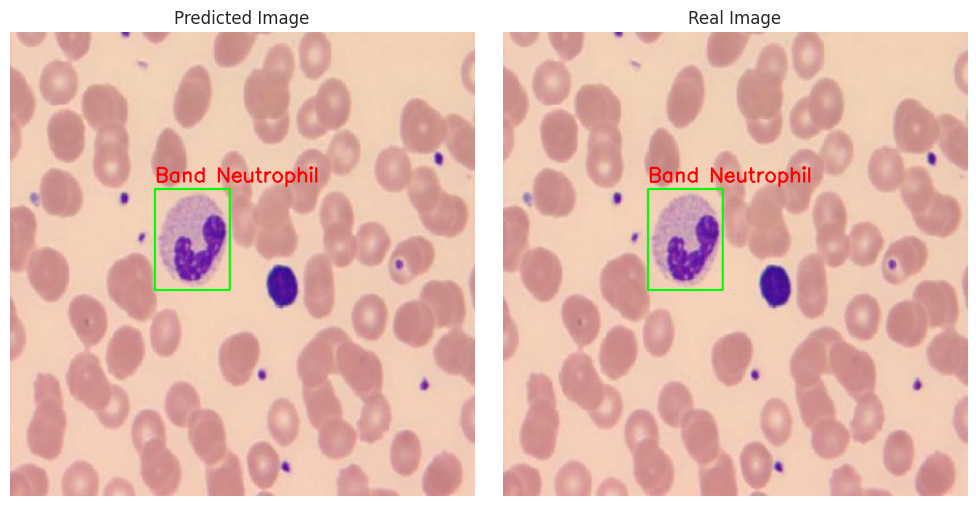

In [23]:
import os
import random
import cv2
import matplotlib.pyplot as plt

# Define the test directory
test_dir = '/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test'

# List all classes in the test directory
classes = ['Atypical lymphocyte', 'Band Neutrophil', 'Basophil', 'Blast', 
           'Eosinophil', 'Lymphocyte', 'Metamyelocyte', 'Monocyte', 
           'Myelocyte', 'NRC', 'Promyelocyte', 'Segmented neutrophil']

# Function to draw bounding boxes from label file
def draw_bbox(labels_path, file_name, image):
    label_file = os.path.join(labels_path, f'{file_name}.txt')
    if os.path.exists(label_file):
        with open(label_file, 'r') as file:
            for line in file.readlines():
                class_id, x_center, y_center, width, height = map(float, line.split())
                # YOLO format normalization needs to be reversed
                img_h, img_w = image.shape[:2]
                x_center, y_center, width, height = x_center * img_w, y_center * img_h, width * img_w, height * img_h
                x1, y1 = int(x_center - width / 2), int(y_center - height / 2)
                x2, y2 = int(x_center + width / 2), int(y_center + height / 2)
                # Draw bounding box
                cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Green for bbox
                # Add class label
                cv2.putText(image, classes[int(class_id)], (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
    else:
        print(f"No label file found for {file_name}")

# Choose a random class and a random file within that class
random_class = random.choice(classes)
images_path = os.path.join(test_dir, 'images')
labels_path = os.path.join(test_dir, 'labels')

# List all images in the selected class
image_files = [f for f in os.listdir(images_path) if f.endswith('.jpg')]

# Pick a random image from the class
random_file = random.choice(image_files)
random_file = os.path.splitext(random_file)[0]

# Full paths for the image and label file
img_pred_path = os.path.join(images_path, f'{random_file}.jpg')
label_pred_path = os.path.join(labels_path, f'{random_file}.txt')

# Try loading the predicted image
img_pred = cv2.imread(img_pred_path, 1)
if img_pred is None:
    print(f"Error: Failed to load the predicted image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_pred = cv2.cvtColor(img_pred, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_pred)

# Try loading the real image
img_real = cv2.imread(img_pred_path, 1)
if img_real is None:
    print(f"Error: Failed to load the real image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_real = cv2.cvtColor(img_real, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_real)

# Display images if both loaded successfully
if img_pred is not None and img_real is not None:
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    axes[0].imshow(img_pred)
    axes[0].set_title('Predicted Image')
    axes[0].axis('off')

    axes[1].imshow(img_real)
    axes[1].set_title('Real Image')
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Could not display images due to loading issues.")


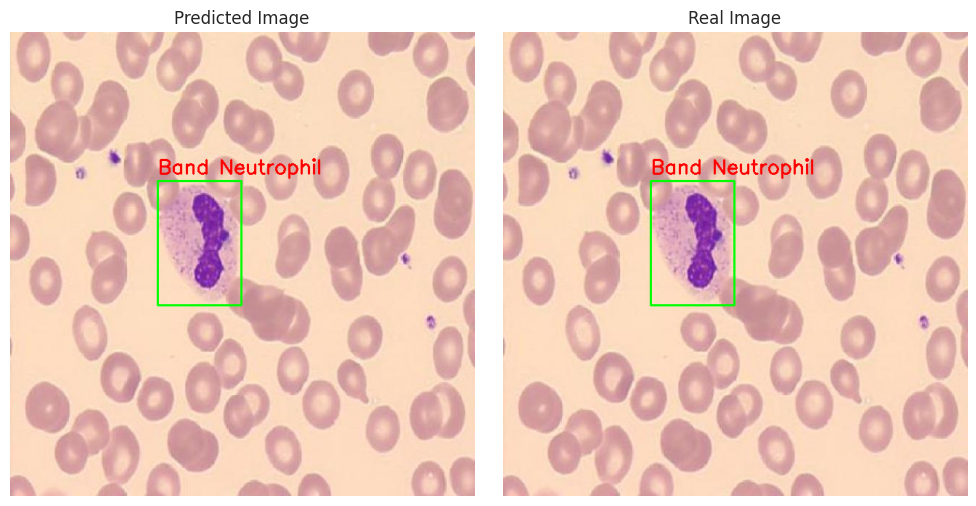

In [24]:
import os
import random
import cv2
import matplotlib.pyplot as plt

# Define the test directory
test_dir = '/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test'

# List all classes in the test directory
classes = ['Atypical lymphocyte', 'Band Neutrophil', 'Basophil', 'Blast', 
           'Eosinophil', 'Lymphocyte', 'Metamyelocyte', 'Monocyte', 
           'Myelocyte', 'NRC', 'Promyelocyte', 'Segmented neutrophil']

# Function to draw bounding boxes from label file
def draw_bbox(labels_path, file_name, image):
    label_file = os.path.join(labels_path, f'{file_name}.txt')
    if os.path.exists(label_file):
        with open(label_file, 'r') as file:
            for line in file.readlines():
                class_id, x_center, y_center, width, height = map(float, line.split())
                # YOLO format normalization needs to be reversed
                img_h, img_w = image.shape[:2]
                x_center, y_center, width, height = x_center * img_w, y_center * img_h, width * img_w, height * img_h
                x1, y1 = int(x_center - width / 2), int(y_center - height / 2)
                x2, y2 = int(x_center + width / 2), int(y_center + height / 2)
                # Draw bounding box
                cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Green for bbox
                # Add class label
                cv2.putText(image, classes[int(class_id)], (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
    else:
        print(f"No label file found for {file_name}")

# Choose a random class and a random file within that class
random_class = random.choice(classes)
images_path = os.path.join(test_dir, 'images')
labels_path = os.path.join(test_dir, 'labels')

# List all images in the selected class
image_files = [f for f in os.listdir(images_path) if f.endswith('.jpg')]

# Pick a random image from the class
random_file = random.choice(image_files)
random_file = os.path.splitext(random_file)[0]

# Full paths for the image and label file
img_pred_path = os.path.join(images_path, f'{random_file}.jpg')
label_pred_path = os.path.join(labels_path, f'{random_file}.txt')

# Try loading the predicted image
img_pred = cv2.imread(img_pred_path, 1)
if img_pred is None:
    print(f"Error: Failed to load the predicted image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_pred = cv2.cvtColor(img_pred, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_pred)

# Try loading the real image
img_real = cv2.imread(img_pred_path, 1)
if img_real is None:
    print(f"Error: Failed to load the real image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_real = cv2.cvtColor(img_real, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_real)

# Display images if both loaded successfully
if img_pred is not None and img_real is not None:
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    axes[0].imshow(img_pred)
    axes[0].set_title('Predicted Image')
    axes[0].axis('off')

    axes[1].imshow(img_real)
    axes[1].set_title('Real Image')
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Could not display images due to loading issues.")


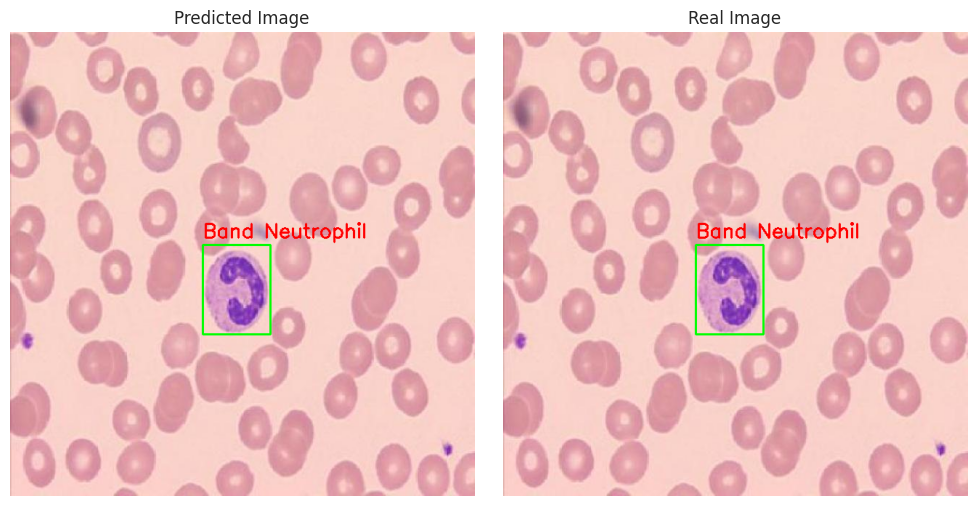

In [25]:
import os
import random
import cv2
import matplotlib.pyplot as plt

# Define the test directory
test_dir = '/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test'

# List all classes in the test directory
classes = ['Atypical lymphocyte', 'Band Neutrophil', 'Basophil', 'Blast', 
           'Eosinophil', 'Lymphocyte', 'Metamyelocyte', 'Monocyte', 
           'Myelocyte', 'NRC', 'Promyelocyte', 'Segmented neutrophil']

# Function to draw bounding boxes from label file
def draw_bbox(labels_path, file_name, image):
    label_file = os.path.join(labels_path, f'{file_name}.txt')
    if os.path.exists(label_file):
        with open(label_file, 'r') as file:
            for line in file.readlines():
                class_id, x_center, y_center, width, height = map(float, line.split())
                # YOLO format normalization needs to be reversed
                img_h, img_w = image.shape[:2]
                x_center, y_center, width, height = x_center * img_w, y_center * img_h, width * img_w, height * img_h
                x1, y1 = int(x_center - width / 2), int(y_center - height / 2)
                x2, y2 = int(x_center + width / 2), int(y_center + height / 2)
                # Draw bounding box
                cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Green for bbox
                # Add class label
                cv2.putText(image, classes[int(class_id)], (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
    else:
        print(f"No label file found for {file_name}")

# Choose a random class and a random file within that class
random_class = random.choice(classes)
images_path = os.path.join(test_dir, 'images')
labels_path = os.path.join(test_dir, 'labels')

# List all images in the selected class
image_files = [f for f in os.listdir(images_path) if f.endswith('.jpg')]

# Pick a random image from the class
random_file = random.choice(image_files)
random_file = os.path.splitext(random_file)[0]

# Full paths for the image and label file
img_pred_path = os.path.join(images_path, f'{random_file}.jpg')
label_pred_path = os.path.join(labels_path, f'{random_file}.txt')

# Try loading the predicted image
img_pred = cv2.imread(img_pred_path, 1)
if img_pred is None:
    print(f"Error: Failed to load the predicted image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_pred = cv2.cvtColor(img_pred, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_pred)

# Try loading the real image
img_real = cv2.imread(img_pred_path, 1)
if img_real is None:
    print(f"Error: Failed to load the real image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_real = cv2.cvtColor(img_real, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_real)

# Display images if both loaded successfully
if img_pred is not None and img_real is not None:
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    axes[0].imshow(img_pred)
    axes[0].set_title('Predicted Image')
    axes[0].axis('off')

    axes[1].imshow(img_real)
    axes[1].set_title('Real Image')
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Could not display images due to loading issues.")


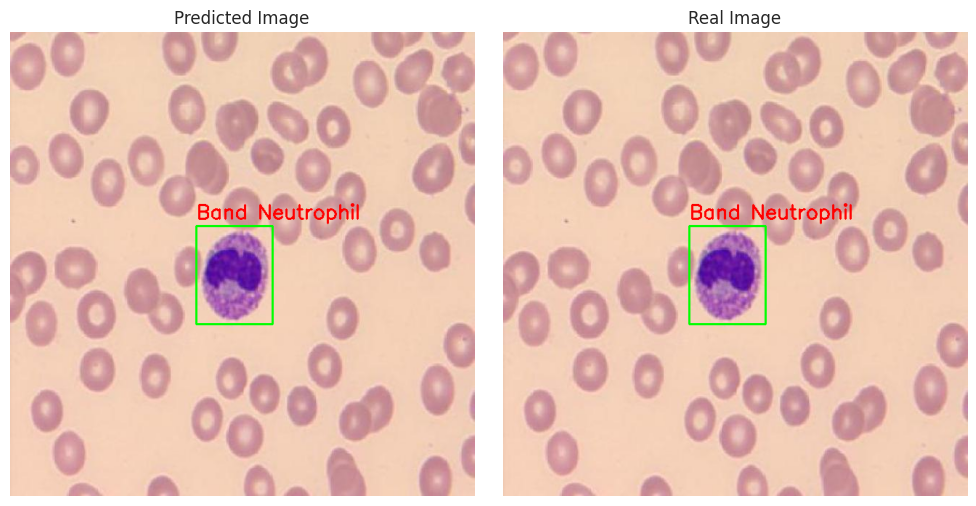

In [26]:
import os
import random
import cv2
import matplotlib.pyplot as plt

# Define the test directory
test_dir = '/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test'

# List all classes in the test directory
classes = ['Atypical lymphocyte', 'Band Neutrophil', 'Basophil', 'Blast', 
           'Eosinophil', 'Lymphocyte', 'Metamyelocyte', 'Monocyte', 
           'Myelocyte', 'NRC', 'Promyelocyte', 'Segmented neutrophil']

# Function to draw bounding boxes from label file
def draw_bbox(labels_path, file_name, image):
    label_file = os.path.join(labels_path, f'{file_name}.txt')
    if os.path.exists(label_file):
        with open(label_file, 'r') as file:
            for line in file.readlines():
                class_id, x_center, y_center, width, height = map(float, line.split())
                # YOLO format normalization needs to be reversed
                img_h, img_w = image.shape[:2]
                x_center, y_center, width, height = x_center * img_w, y_center * img_h, width * img_w, height * img_h
                x1, y1 = int(x_center - width / 2), int(y_center - height / 2)
                x2, y2 = int(x_center + width / 2), int(y_center + height / 2)
                # Draw bounding box
                cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Green for bbox
                # Add class label
                cv2.putText(image, classes[int(class_id)], (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
    else:
        print(f"No label file found for {file_name}")

# Choose a random class and a random file within that class
random_class = random.choice(classes)
images_path = os.path.join(test_dir, 'images')
labels_path = os.path.join(test_dir, 'labels')

# List all images in the selected class
image_files = [f for f in os.listdir(images_path) if f.endswith('.jpg')]

# Pick a random image from the class
random_file = random.choice(image_files)
random_file = os.path.splitext(random_file)[0]

# Full paths for the image and label file
img_pred_path = os.path.join(images_path, f'{random_file}.jpg')
label_pred_path = os.path.join(labels_path, f'{random_file}.txt')

# Try loading the predicted image
img_pred = cv2.imread(img_pred_path, 1)
if img_pred is None:
    print(f"Error: Failed to load the predicted image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_pred = cv2.cvtColor(img_pred, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_pred)

# Try loading the real image
img_real = cv2.imread(img_pred_path, 1)
if img_real is None:
    print(f"Error: Failed to load the real image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_real = cv2.cvtColor(img_real, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_real)

# Display images if both loaded successfully
if img_pred is not None and img_real is not None:
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    axes[0].imshow(img_pred)
    axes[0].set_title('Predicted Image')
    axes[0].axis('off')

    axes[1].imshow(img_real)
    axes[1].set_title('Real Image')
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Could not display images due to loading issues.")


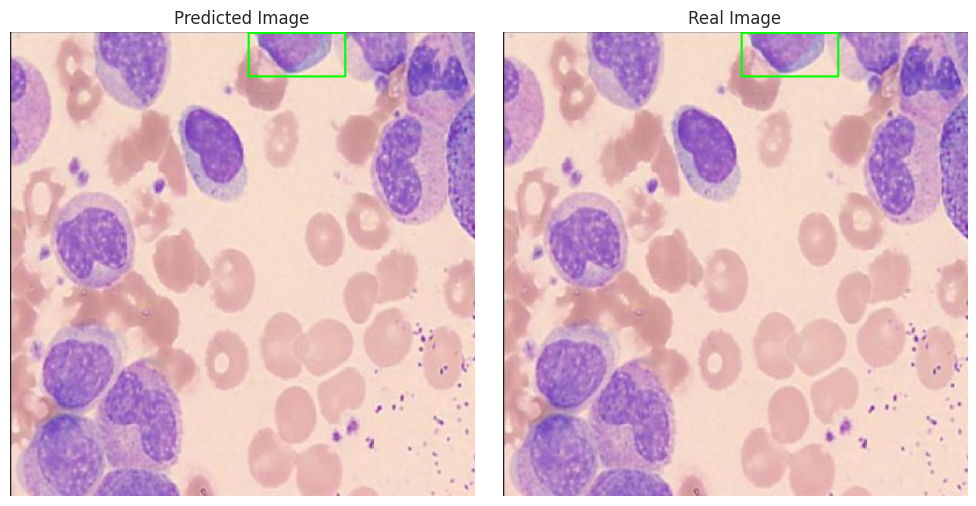

In [27]:
import os
import random
import cv2
import matplotlib.pyplot as plt

# Define the test directory
test_dir = '/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test'

# List all classes in the test directory
classes = ['Atypical lymphocyte', 'Band Neutrophil', 'Basophil', 'Blast', 
           'Eosinophil', 'Lymphocyte', 'Metamyelocyte', 'Monocyte', 
           'Myelocyte', 'NRC', 'Promyelocyte', 'Segmented neutrophil']

# Function to draw bounding boxes from label file
def draw_bbox(labels_path, file_name, image):
    label_file = os.path.join(labels_path, f'{file_name}.txt')
    if os.path.exists(label_file):
        with open(label_file, 'r') as file:
            for line in file.readlines():
                class_id, x_center, y_center, width, height = map(float, line.split())
                # YOLO format normalization needs to be reversed
                img_h, img_w = image.shape[:2]
                x_center, y_center, width, height = x_center * img_w, y_center * img_h, width * img_w, height * img_h
                x1, y1 = int(x_center - width / 2), int(y_center - height / 2)
                x2, y2 = int(x_center + width / 2), int(y_center + height / 2)
                # Draw bounding box
                cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Green for bbox
                # Add class label
                cv2.putText(image, classes[int(class_id)], (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
    else:
        print(f"No label file found for {file_name}")

# Choose a random class and a random file within that class
random_class = random.choice(classes)
images_path = os.path.join(test_dir, 'images')
labels_path = os.path.join(test_dir, 'labels')

# List all images in the selected class
image_files = [f for f in os.listdir(images_path) if f.endswith('.jpg')]

# Pick a random image from the class
random_file = random.choice(image_files)
random_file = os.path.splitext(random_file)[0]

# Full paths for the image and label file
img_pred_path = os.path.join(images_path, f'{random_file}.jpg')
label_pred_path = os.path.join(labels_path, f'{random_file}.txt')

# Try loading the predicted image
img_pred = cv2.imread(img_pred_path, 1)
if img_pred is None:
    print(f"Error: Failed to load the predicted image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_pred = cv2.cvtColor(img_pred, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_pred)

# Try loading the real image
img_real = cv2.imread(img_pred_path, 1)
if img_real is None:
    print(f"Error: Failed to load the real image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_real = cv2.cvtColor(img_real, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_real)

# Display images if both loaded successfully
if img_pred is not None and img_real is not None:
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    axes[0].imshow(img_pred)
    axes[0].set_title('Predicted Image')
    axes[0].axis('off')

    axes[1].imshow(img_real)
    axes[1].set_title('Real Image')
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Could not display images due to loading issues.")


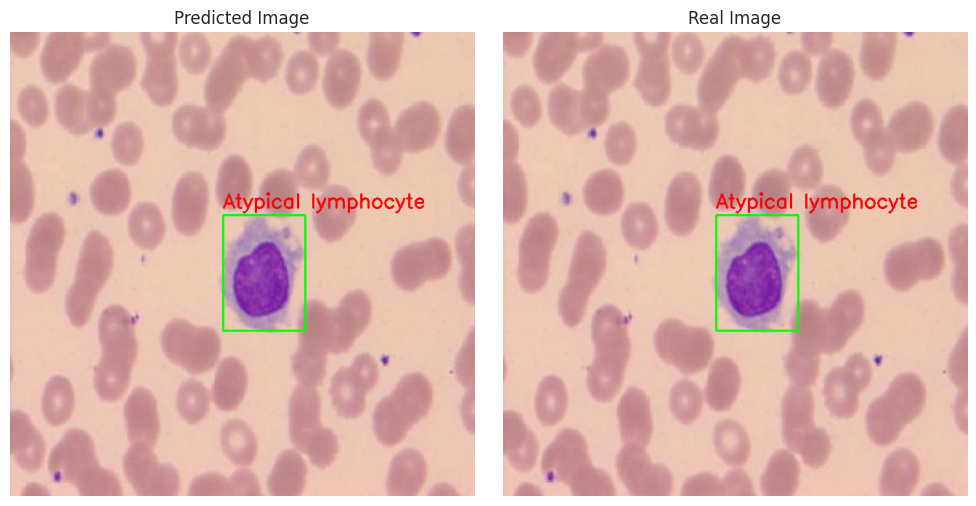

In [28]:
import os
import random
import cv2
import matplotlib.pyplot as plt

# Define the test directory
test_dir = '/kaggle/input/wbcdetect/Muliticlass WBC Detect.v1i.yolov11/test'

# List all classes in the test directory
classes = ['Atypical lymphocyte', 'Band Neutrophil', 'Basophil', 'Blast', 
           'Eosinophil', 'Lymphocyte', 'Metamyelocyte', 'Monocyte', 
           'Myelocyte', 'NRC', 'Promyelocyte', 'Segmented neutrophil']

# Function to draw bounding boxes from label file
def draw_bbox(labels_path, file_name, image):
    label_file = os.path.join(labels_path, f'{file_name}.txt')
    if os.path.exists(label_file):
        with open(label_file, 'r') as file:
            for line in file.readlines():
                class_id, x_center, y_center, width, height = map(float, line.split())
                # YOLO format normalization needs to be reversed
                img_h, img_w = image.shape[:2]
                x_center, y_center, width, height = x_center * img_w, y_center * img_h, width * img_w, height * img_h
                x1, y1 = int(x_center - width / 2), int(y_center - height / 2)
                x2, y2 = int(x_center + width / 2), int(y_center + height / 2)
                # Draw bounding box
                cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Green for bbox
                # Add class label
                cv2.putText(image, classes[int(class_id)], (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
    else:
        print(f"No label file found for {file_name}")

# Choose a random class and a random file within that class
random_class = random.choice(classes)
images_path = os.path.join(test_dir, 'images')
labels_path = os.path.join(test_dir, 'labels')

# List all images in the selected class
image_files = [f for f in os.listdir(images_path) if f.endswith('.jpg')]

# Pick a random image from the class
random_file = random.choice(image_files)
random_file = os.path.splitext(random_file)[0]

# Full paths for the image and label file
img_pred_path = os.path.join(images_path, f'{random_file}.jpg')
label_pred_path = os.path.join(labels_path, f'{random_file}.txt')

# Try loading the predicted image
img_pred = cv2.imread(img_pred_path, 1)
if img_pred is None:
    print(f"Error: Failed to load the predicted image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_pred = cv2.cvtColor(img_pred, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_pred)

# Try loading the real image
img_real = cv2.imread(img_pred_path, 1)
if img_real is None:
    print(f"Error: Failed to load the real image at {img_pred_path}. Check the file path or file integrity.")
else:
    img_real = cv2.cvtColor(img_real, cv2.COLOR_BGR2RGB)
    draw_bbox(labels_path, random_file, img_real)

# Display images if both loaded successfully
if img_pred is not None and img_real is not None:
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    axes[0].imshow(img_pred)
    axes[0].set_title('Predicted Image')
    axes[0].axis('off')

    axes[1].imshow(img_real)
    axes[1].set_title('Real Image')
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Could not display images due to loading issues.")


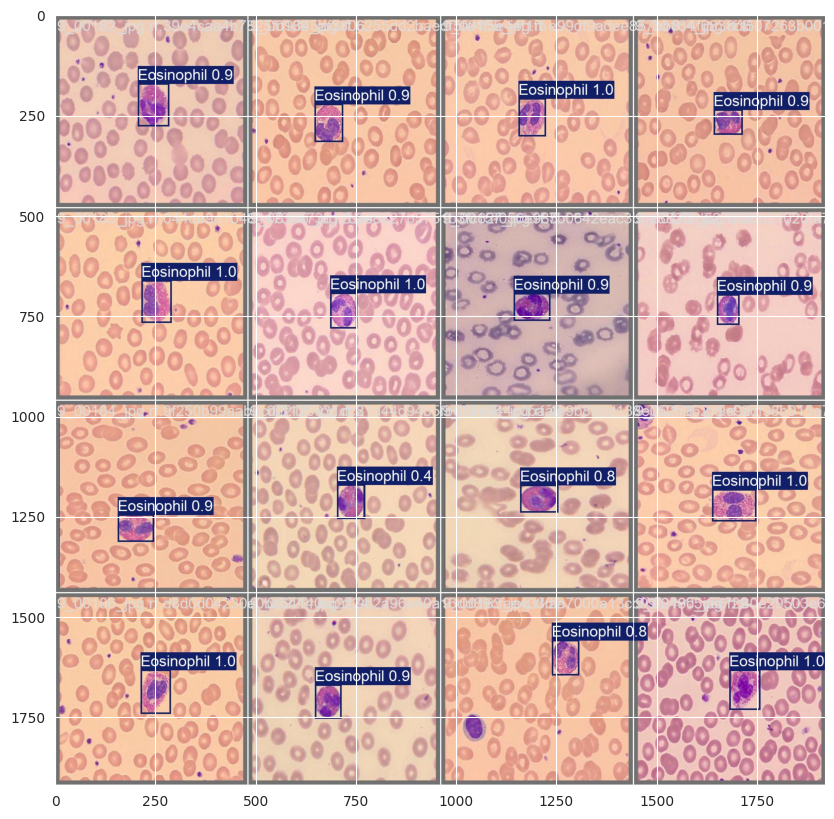

In [30]:
from PIL import Image  # Importing the Image module from PIL
import matplotlib.pyplot as plt
image_path = '/kaggle/working/runs/detect/train2/val_batch0_pred.jpg'
plt.figure(figsize=(20, 10))
img = Image.open(image_path)
plt.imshow(img)
plt.show()

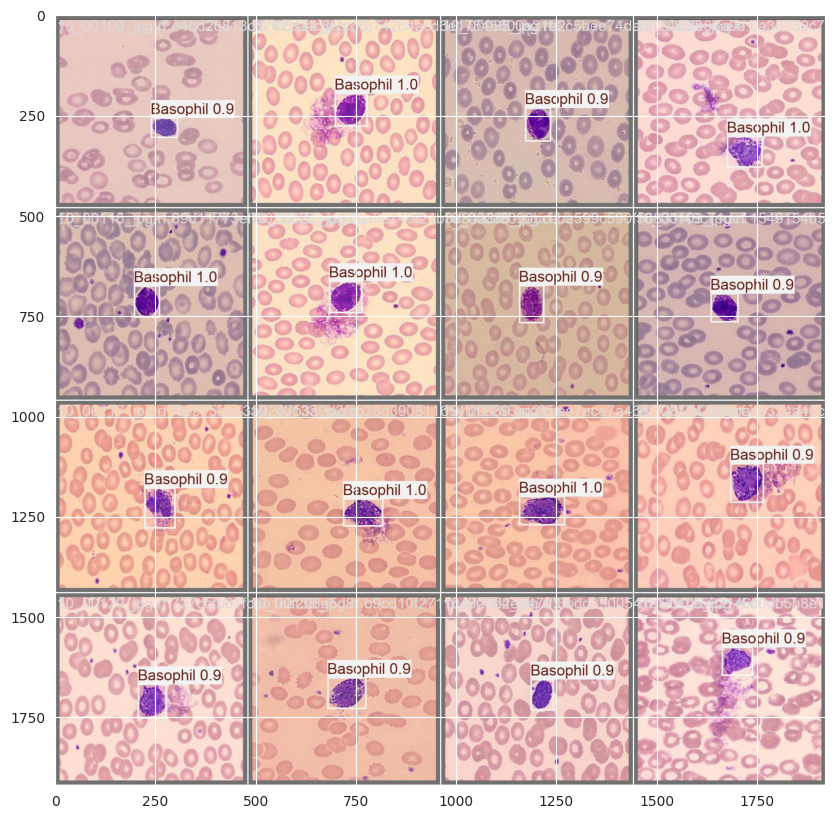

In [31]:
image_path = '/kaggle/working/runs/detect/train2/val_batch1_pred.jpg'
plt.figure(figsize=(20, 10))
img = Image.open(image_path)
plt.imshow(img)
plt.show()